In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.linear_model import LinearRegression
import warnings
warnings.filterwarnings("ignore", message=".*Tight layout not applied.*")

In [2]:
df = pd.read_csv("../data/final_economic_data.csv")

### Preprocessing

In [3]:
df_total = df.copy()
df_total["Region"] = df_total["Region"].astype(str).str.strip().astype(int)
df_total = df_total[(df_total["Region"] != 3) & (df_total["Region"] != 20)]
regions = sorted(df_total["Region"].unique())

trade_cols = ["Exports (euro)", "Imports (euro)"]
sector_cols = [col for col in df.columns if col.startswith('Gross value added')]
print(sector_cols)
# sector_cols = [
#     "Gross value added (millions of euro), A Agriculture, forestry and fishing",
#     "Gross value added (millions of euro), B Mining and quarrying",
#     "Gross value added (millions of euro), F Construction",
#     "Gross value added (millions of euro), G Wholesale and retail trade; repair of motor vehicles and motorcycles",
#     "Gross value added (millions of euro), H Transportation and storage",
#     "Gross value added (millions of euro), I Accommodation and food service activities",
#     "Gross value added (millions of euro), J Information and communication",
#     "Gross value added (millions of euro), K Financial and insurance activities",
#     "Gross value added (millions of euro), M Professional, scientific and technical activities",
#     "Gross value added (millions of euro), N Administrative and support service activities",
#     "Gross value added (millions of euro), O Public administration and defence; compulsory social security",
#     "Gross value added (millions of euro), P Education",
#     "Gross value added (millions of euro), Q Human health and social work activities",
#     "Gross value added (millions of euro), R, S Other service activities",
#     "Gross value added (millions of euro),  T Activities of households as employers; undifferentiated goods- and services-producing activities of households for own use"
# ]

['Gross value added (millions of euro), C Manufacturing (10-33)', 'Gross value added (millions of euro), D, E Electricity, gas, steam and air conditioning and water supply; sewerage and waste management (35-39)', 'Gross value added (millions of euro), L Real estate activities', 'Gross value added (millions of euro), A Agriculture, forestry and fishing (01-03)', 'Gross value added (millions of euro), B Mining and quarrying (05-09)', 'Gross value added (millions of euro), F Construction (41-43)', 'Gross value added (millions of euro), G Wholesale and retail trade; repair of motor vehicles and motorcycles (45-47)', 'Gross value added (millions of euro), H Transportation and storage (49-53)', 'Gross value added (millions of euro), I Accommodation and food service activities (55-56)', 'Gross value added (millions of euro), J Information and communication (58-63)', 'Gross value added (millions of euro), K Financial and insurance activities (64-66)', 'Gross value added (millions of euro), M P

In [4]:
#cleaning sector names for better display
# clean_sector_names = [col.replace("Gross value added (millions of euro), ", "").strip() for col in sector_cols]
# rename_map = dict(zip(sector_cols, clean_sector_names))
# df_total = df_total.rename(columns=rename_map)
# sector_cols = clean_sector_names 

### Strongest Sectors by Region (average GVA 2000–2022)

In [5]:
#strongest industries by region
print("Strongest Sectors by Region (average GVA 2000–2022)\n")
df_sector = df_total[(df_total["Year"] >= 2000) & (df_total["Year"] <= 2022)]

region_sector_mean = df_sector.groupby("Region")[sector_cols].mean()

#top 5 sectors per region
for region in region_sector_mean.index:
    top5 = (region_sector_mean.loc[region].sort_values(ascending=False).head(5))
    print(f"\n{region}:")
    for sector, value in top5.items():
        print(f"  - {sector}: {value:.1f} Millions of euro")

Strongest Sectors by Region (average GVA 2000–2022)


1:
  - Gross value added (millions of euro), C Manufacturing (10-33): 16071.3 Millions of euro
  - Gross value added (millions of euro), G Wholesale and retail trade; repair of motor vehicles and motorcycles (45-47): 8041.3 Millions of euro
  - Gross value added (millions of euro), L Real estate activities: 7150.3 Millions of euro
  - Gross value added (millions of euro), J Information and communication (58-63): 5968.7 Millions of euro
  - Gross value added (millions of euro), Q Human health and social work activities (86-88): 4541.1 Millions of euro

2:
  - Gross value added (millions of euro), C Manufacturing (10-33): 5814.4 Millions of euro
  - Gross value added (millions of euro), L Real estate activities: 1674.5 Millions of euro
  - Gross value added (millions of euro), Q Human health and social work activities (86-88): 1455.1 Millions of euro
  - Gross value added (millions of euro), G Wholesale and retail trade; repair of mot

### Getting rid of linear term

In [6]:
#removes linear trend with respect to time
def detrend_dataframe(df):
    df_detrended = pd.DataFrame(index=df.index)
    X = df["Year"].values.reshape(-1, 1)

    for col in df.columns:
        if col == "Year":
            continue
        y = df[col].values.reshape(-1, 1)
        if np.all(np.isnan(y)):
            df_detrended[col] = np.nan
            continue
        model = LinearRegression().fit(X, y)
        y_pred = model.predict(X)
        df_detrended[col] = (y - y_pred).flatten()

    return df_detrended

### Trade Sector correlations per region


Trade Sector correlations per region


Region: 1
                                                    Exports (euro)  \
Gross value added (millions of euro), C Manufac...           0.762   
Gross value added (millions of euro), D, E Elec...           0.595   
Gross value added (millions of euro), L Real es...          -0.571   
Gross value added (millions of euro), A Agricul...           0.667   
Gross value added (millions of euro), B Mining ...          -0.310   
Gross value added (millions of euro), F Constru...          -0.595   
Gross value added (millions of euro), G Wholesa...           0.024   
Gross value added (millions of euro), H Transpo...           0.571   
Gross value added (millions of euro), I Accommo...           0.500   
Gross value added (millions of euro), J Informa...          -0.286   
Gross value added (millions of euro), K Financi...           0.548   
Gross value added (millions of euro), M Profess...           0.548   
Gross value added (millions of euro), N 

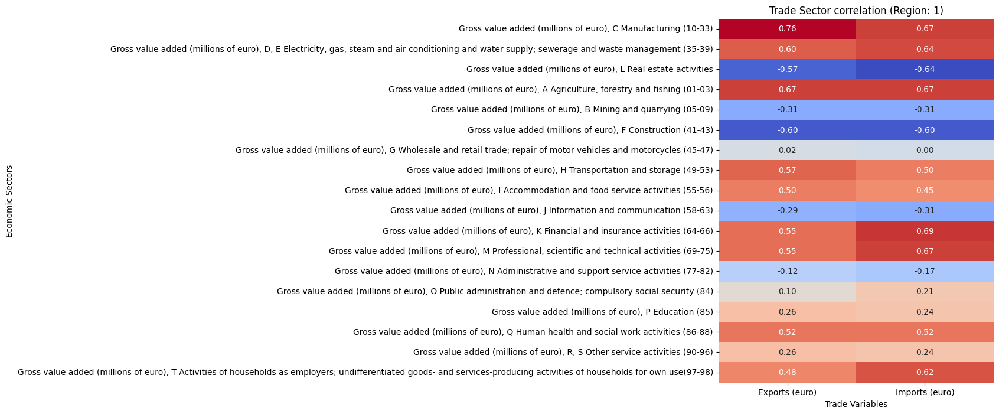


Region: 2
                                                    Exports (euro)  \
Gross value added (millions of euro), C Manufac...           0.405   
Gross value added (millions of euro), D, E Elec...           0.667   
Gross value added (millions of euro), L Real es...           0.143   
Gross value added (millions of euro), A Agricul...          -0.262   
Gross value added (millions of euro), B Mining ...           0.690   
Gross value added (millions of euro), F Constru...           0.286   
Gross value added (millions of euro), G Wholesa...           0.381   
Gross value added (millions of euro), H Transpo...           0.619   
Gross value added (millions of euro), I Accommo...           0.357   
Gross value added (millions of euro), J Informa...           0.024   
Gross value added (millions of euro), K Financi...           0.000   
Gross value added (millions of euro), M Profess...           0.381   
Gross value added (millions of euro), N Adminis...           0.619   
Gross val

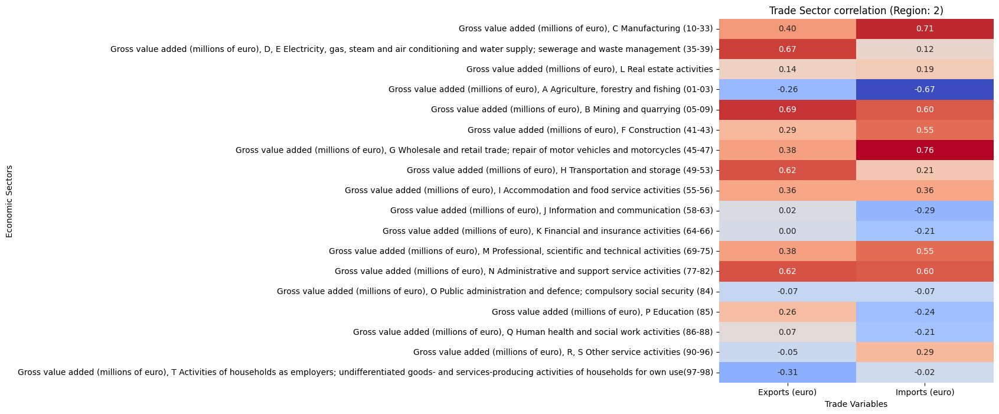


Region: 4
                                                    Exports (euro)  \
Gross value added (millions of euro), C Manufac...           0.548   
Gross value added (millions of euro), D, E Elec...           0.119   
Gross value added (millions of euro), L Real es...           0.048   
Gross value added (millions of euro), A Agricul...          -0.524   
Gross value added (millions of euro), B Mining ...          -0.405   
Gross value added (millions of euro), F Constru...          -0.286   
Gross value added (millions of euro), G Wholesa...           0.571   
Gross value added (millions of euro), H Transpo...           0.810   
Gross value added (millions of euro), I Accommo...           0.429   
Gross value added (millions of euro), J Informa...           0.333   
Gross value added (millions of euro), K Financi...           0.810   
Gross value added (millions of euro), M Profess...           0.095   
Gross value added (millions of euro), N Adminis...           0.238   
Gross val

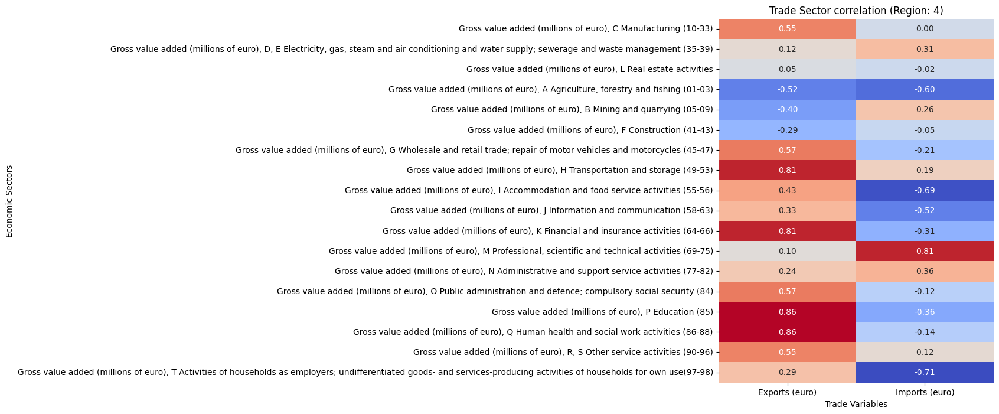


Region: 5
                                                    Exports (euro)  \
Gross value added (millions of euro), C Manufac...           0.262   
Gross value added (millions of euro), D, E Elec...           0.786   
Gross value added (millions of euro), L Real es...           0.357   
Gross value added (millions of euro), A Agricul...          -0.071   
Gross value added (millions of euro), B Mining ...           0.119   
Gross value added (millions of euro), F Constru...          -0.524   
Gross value added (millions of euro), G Wholesa...           0.357   
Gross value added (millions of euro), H Transpo...           0.667   
Gross value added (millions of euro), I Accommo...           0.690   
Gross value added (millions of euro), J Informa...          -0.024   
Gross value added (millions of euro), K Financi...           0.667   
Gross value added (millions of euro), M Profess...           0.857   
Gross value added (millions of euro), N Adminis...           0.619   
Gross val

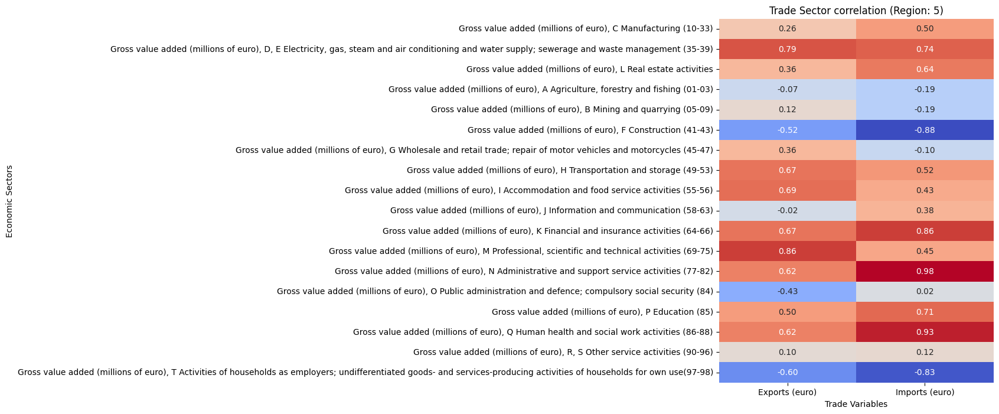


Region: 6
                                                    Exports (euro)  \
Gross value added (millions of euro), C Manufac...          -0.667   
Gross value added (millions of euro), D, E Elec...           0.500   
Gross value added (millions of euro), L Real es...           0.333   
Gross value added (millions of euro), A Agricul...           0.619   
Gross value added (millions of euro), B Mining ...          -0.714   
Gross value added (millions of euro), F Constru...           0.095   
Gross value added (millions of euro), G Wholesa...           0.667   
Gross value added (millions of euro), H Transpo...           0.524   
Gross value added (millions of euro), I Accommo...           0.452   
Gross value added (millions of euro), J Informa...           0.619   
Gross value added (millions of euro), K Financi...           0.714   
Gross value added (millions of euro), M Profess...           0.810   
Gross value added (millions of euro), N Adminis...           0.595   
Gross val

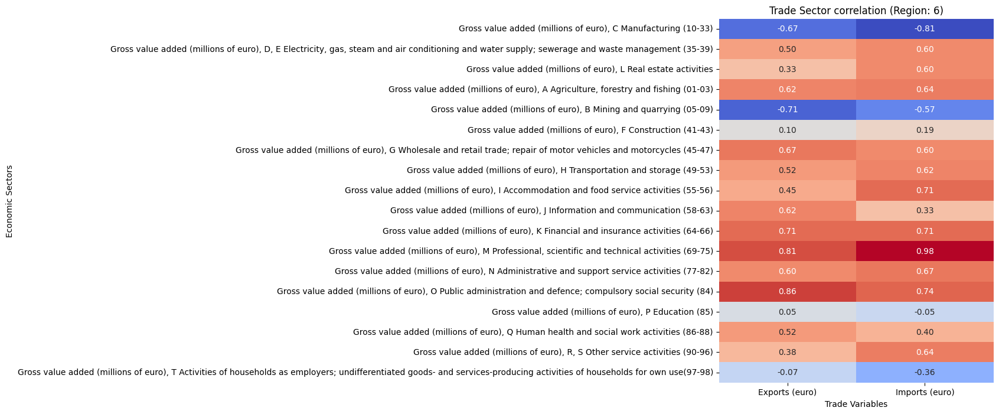


Region: 7
                                                    Exports (euro)  \
Gross value added (millions of euro), C Manufac...          -0.071   
Gross value added (millions of euro), D, E Elec...           0.071   
Gross value added (millions of euro), L Real es...           0.071   
Gross value added (millions of euro), A Agricul...           0.357   
Gross value added (millions of euro), B Mining ...          -0.024   
Gross value added (millions of euro), F Constru...           0.095   
Gross value added (millions of euro), G Wholesa...           0.262   
Gross value added (millions of euro), H Transpo...           0.571   
Gross value added (millions of euro), I Accommo...           0.357   
Gross value added (millions of euro), J Informa...           0.643   
Gross value added (millions of euro), K Financi...          -0.143   
Gross value added (millions of euro), M Profess...          -0.190   
Gross value added (millions of euro), N Adminis...           0.167   
Gross val

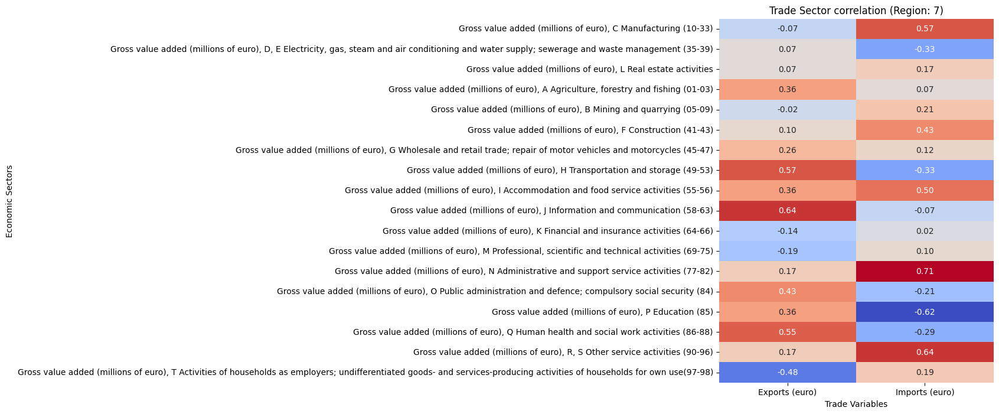


Region: 8
                                                    Exports (euro)  \
Gross value added (millions of euro), C Manufac...           0.786   
Gross value added (millions of euro), D, E Elec...           0.548   
Gross value added (millions of euro), L Real es...          -0.071   
Gross value added (millions of euro), A Agricul...           0.286   
Gross value added (millions of euro), B Mining ...          -0.452   
Gross value added (millions of euro), F Constru...          -0.095   
Gross value added (millions of euro), G Wholesa...          -0.310   
Gross value added (millions of euro), H Transpo...           0.048   
Gross value added (millions of euro), I Accommo...           0.571   
Gross value added (millions of euro), J Informa...           0.024   
Gross value added (millions of euro), K Financi...          -0.357   
Gross value added (millions of euro), M Profess...          -0.262   
Gross value added (millions of euro), N Adminis...           0.286   
Gross val

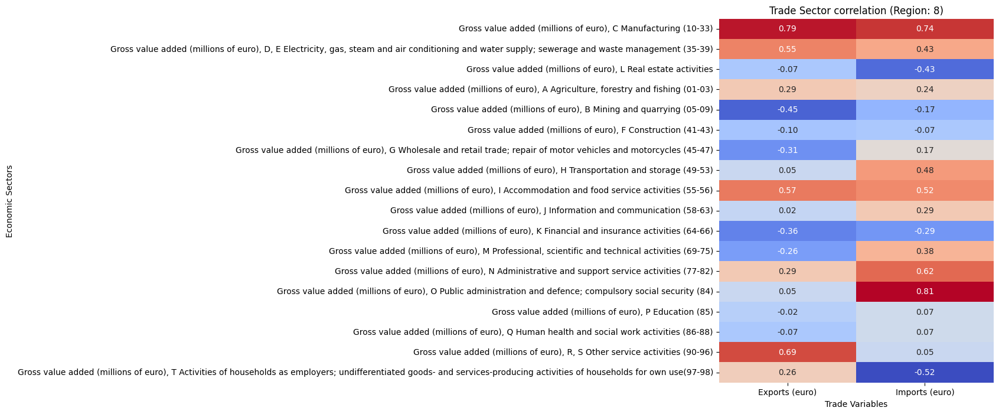


Region: 9
                                                    Exports (euro)  \
Gross value added (millions of euro), C Manufac...           0.405   
Gross value added (millions of euro), D, E Elec...           0.452   
Gross value added (millions of euro), L Real es...           0.024   
Gross value added (millions of euro), A Agricul...           0.429   
Gross value added (millions of euro), B Mining ...           0.429   
Gross value added (millions of euro), F Constru...           0.048   
Gross value added (millions of euro), G Wholesa...          -0.429   
Gross value added (millions of euro), H Transpo...          -0.262   
Gross value added (millions of euro), I Accommo...           0.595   
Gross value added (millions of euro), J Informa...           0.429   
Gross value added (millions of euro), K Financi...           0.786   
Gross value added (millions of euro), M Profess...          -0.119   
Gross value added (millions of euro), N Adminis...          -0.429   
Gross val

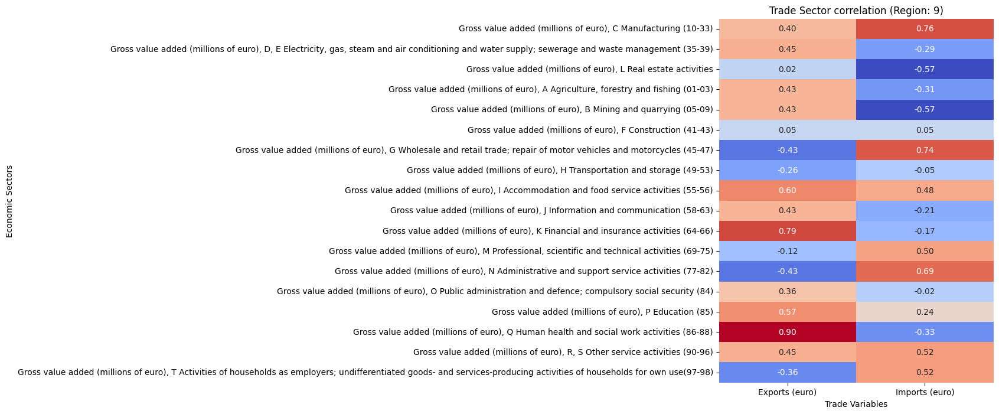


Region: 10
                                                    Exports (euro)  \
Gross value added (millions of euro), C Manufac...           0.524   
Gross value added (millions of euro), D, E Elec...           0.262   
Gross value added (millions of euro), L Real es...           0.310   
Gross value added (millions of euro), A Agricul...           0.000   
Gross value added (millions of euro), B Mining ...           0.167   
Gross value added (millions of euro), F Constru...          -0.571   
Gross value added (millions of euro), G Wholesa...          -0.524   
Gross value added (millions of euro), H Transpo...          -0.095   
Gross value added (millions of euro), I Accommo...           0.476   
Gross value added (millions of euro), J Informa...          -0.405   
Gross value added (millions of euro), K Financi...           0.881   
Gross value added (millions of euro), M Profess...           0.714   
Gross value added (millions of euro), N Adminis...           0.190   
Gross va

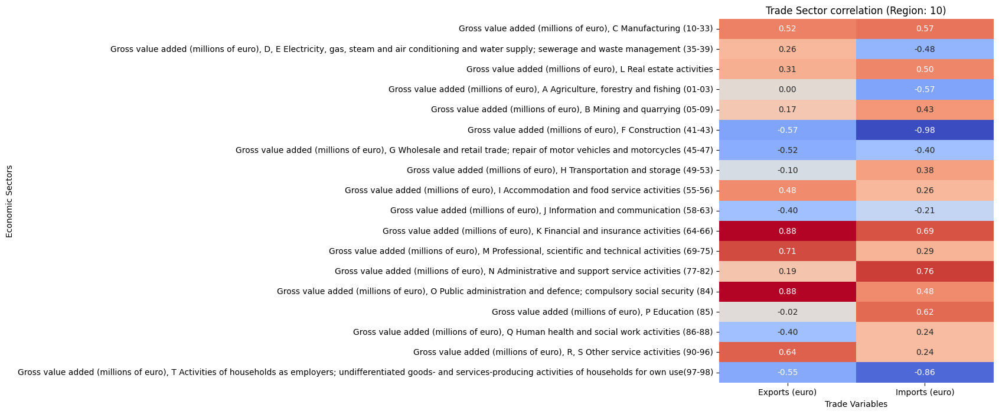


Region: 11
                                                    Exports (euro)  \
Gross value added (millions of euro), C Manufac...           0.857   
Gross value added (millions of euro), D, E Elec...           0.571   
Gross value added (millions of euro), L Real es...           0.452   
Gross value added (millions of euro), A Agricul...           0.833   
Gross value added (millions of euro), B Mining ...           0.095   
Gross value added (millions of euro), F Constru...           0.452   
Gross value added (millions of euro), G Wholesa...           0.024   
Gross value added (millions of euro), H Transpo...           0.571   
Gross value added (millions of euro), I Accommo...           0.429   
Gross value added (millions of euro), J Informa...          -0.119   
Gross value added (millions of euro), K Financi...           0.810   
Gross value added (millions of euro), M Profess...          -0.286   
Gross value added (millions of euro), N Adminis...           0.143   
Gross va

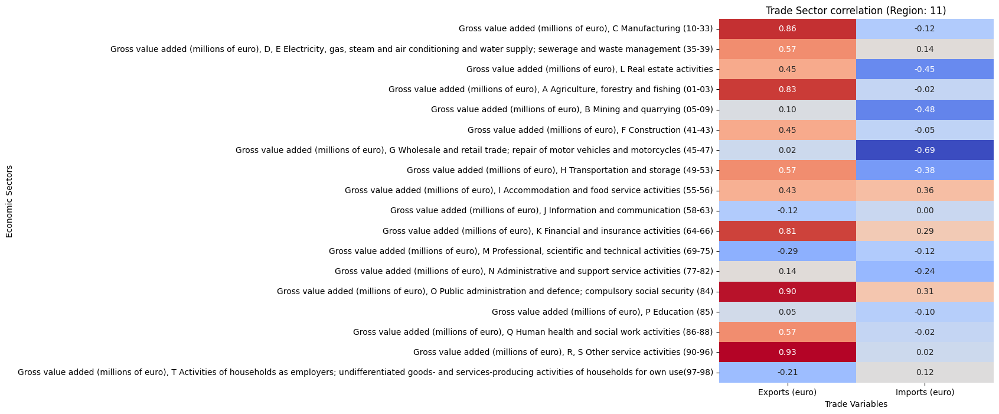


Region: 12
                                                    Exports (euro)  \
Gross value added (millions of euro), C Manufac...           0.690   
Gross value added (millions of euro), D, E Elec...          -0.071   
Gross value added (millions of euro), L Real es...           0.286   
Gross value added (millions of euro), A Agricul...           0.381   
Gross value added (millions of euro), B Mining ...          -0.214   
Gross value added (millions of euro), F Constru...           0.500   
Gross value added (millions of euro), G Wholesa...          -0.095   
Gross value added (millions of euro), H Transpo...           0.048   
Gross value added (millions of euro), I Accommo...           0.738   
Gross value added (millions of euro), J Informa...           0.667   
Gross value added (millions of euro), K Financi...          -0.595   
Gross value added (millions of euro), M Profess...           0.476   
Gross value added (millions of euro), N Adminis...           0.095   
Gross va

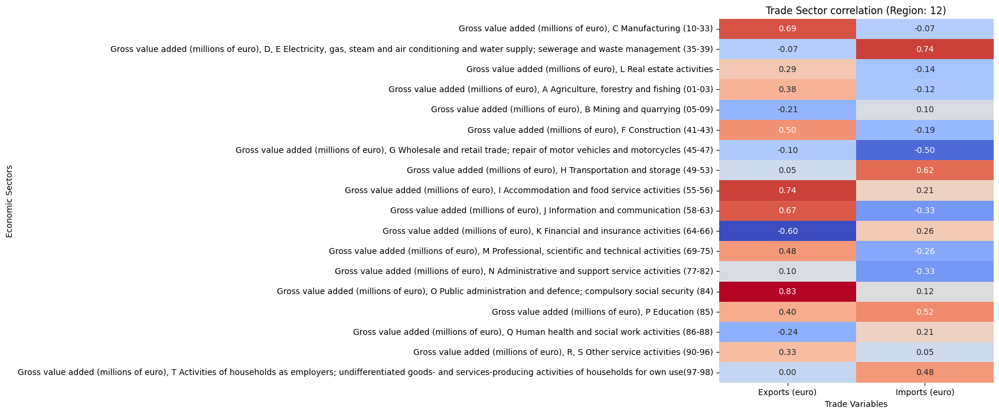


Region: 13
                                                    Exports (euro)  \
Gross value added (millions of euro), C Manufac...           0.429   
Gross value added (millions of euro), D, E Elec...           0.619   
Gross value added (millions of euro), L Real es...           0.238   
Gross value added (millions of euro), A Agricul...          -0.548   
Gross value added (millions of euro), B Mining ...           0.000   
Gross value added (millions of euro), F Constru...          -0.881   
Gross value added (millions of euro), G Wholesa...           0.571   
Gross value added (millions of euro), H Transpo...           0.333   
Gross value added (millions of euro), I Accommo...           0.429   
Gross value added (millions of euro), J Informa...           0.405   
Gross value added (millions of euro), K Financi...           0.905   
Gross value added (millions of euro), M Profess...          -0.024   
Gross value added (millions of euro), N Adminis...          -0.024   
Gross va

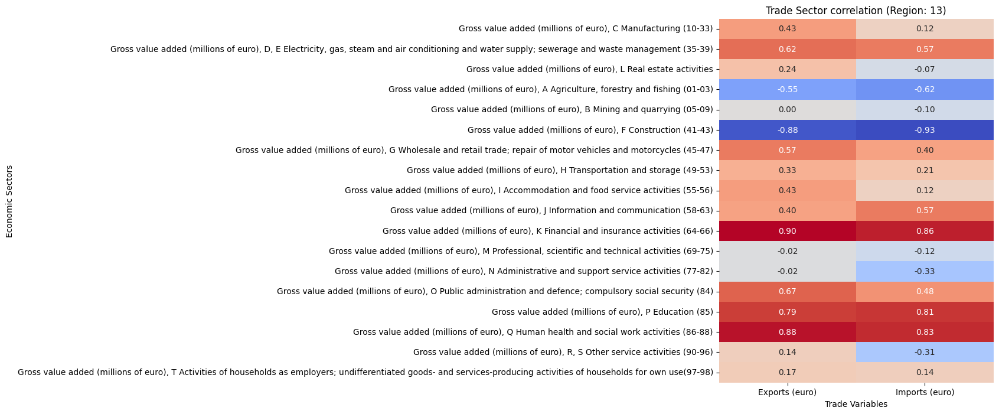


Region: 14
                                                    Exports (euro)  \
Gross value added (millions of euro), C Manufac...           0.690   
Gross value added (millions of euro), D, E Elec...           0.143   
Gross value added (millions of euro), L Real es...           0.095   
Gross value added (millions of euro), A Agricul...          -0.024   
Gross value added (millions of euro), B Mining ...          -0.524   
Gross value added (millions of euro), F Constru...           0.524   
Gross value added (millions of euro), G Wholesa...           0.167   
Gross value added (millions of euro), H Transpo...           0.095   
Gross value added (millions of euro), I Accommo...           0.714   
Gross value added (millions of euro), J Informa...           0.810   
Gross value added (millions of euro), K Financi...           0.595   
Gross value added (millions of euro), M Profess...          -0.405   
Gross value added (millions of euro), N Adminis...           0.857   
Gross va

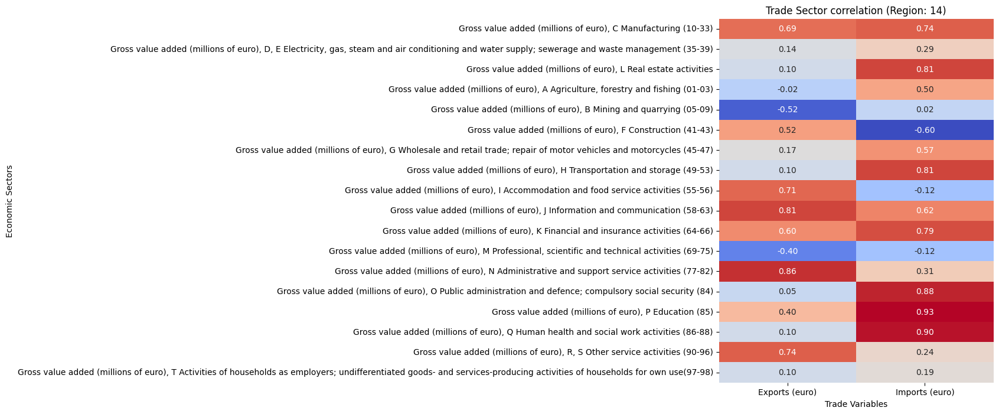


Region: 15
                                                    Exports (euro)  \
Gross value added (millions of euro), C Manufac...           0.190   
Gross value added (millions of euro), D, E Elec...           0.381   
Gross value added (millions of euro), L Real es...           0.667   
Gross value added (millions of euro), A Agricul...           0.000   
Gross value added (millions of euro), B Mining ...           0.286   
Gross value added (millions of euro), F Constru...          -0.571   
Gross value added (millions of euro), G Wholesa...           0.810   
Gross value added (millions of euro), H Transpo...           0.786   
Gross value added (millions of euro), I Accommo...          -0.095   
Gross value added (millions of euro), J Informa...           0.833   
Gross value added (millions of euro), K Financi...           0.929   
Gross value added (millions of euro), M Profess...          -0.333   
Gross value added (millions of euro), N Adminis...           0.476   
Gross va

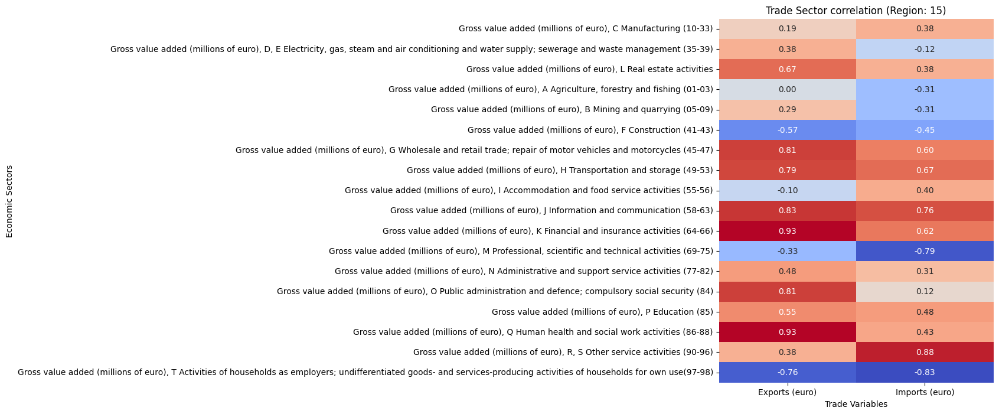


Region: 16
                                                    Exports (euro)  \
Gross value added (millions of euro), C Manufac...           0.429   
Gross value added (millions of euro), D, E Elec...           0.190   
Gross value added (millions of euro), L Real es...           0.476   
Gross value added (millions of euro), A Agricul...          -0.071   
Gross value added (millions of euro), B Mining ...           0.214   
Gross value added (millions of euro), F Constru...           0.619   
Gross value added (millions of euro), G Wholesa...           0.024   
Gross value added (millions of euro), H Transpo...           0.095   
Gross value added (millions of euro), I Accommo...           0.381   
Gross value added (millions of euro), J Informa...          -0.167   
Gross value added (millions of euro), K Financi...          -0.452   
Gross value added (millions of euro), M Profess...          -0.167   
Gross value added (millions of euro), N Adminis...          -0.143   
Gross va

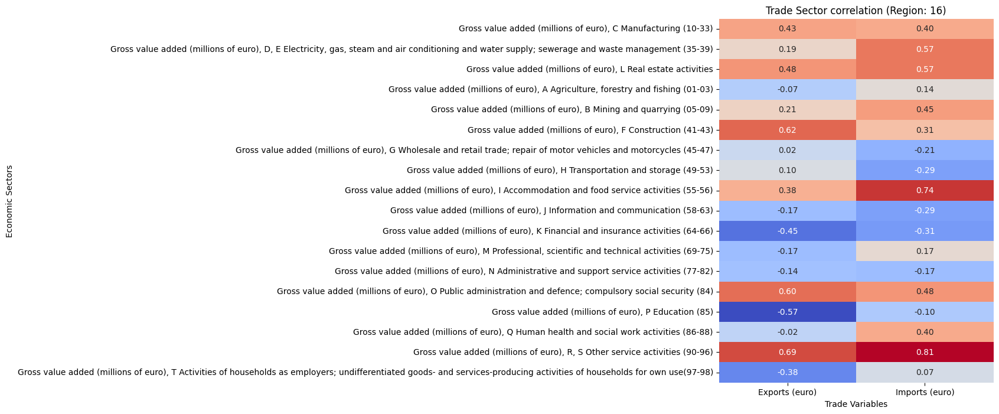


Region: 17
                                                    Exports (euro)  \
Gross value added (millions of euro), C Manufac...          -0.333   
Gross value added (millions of euro), D, E Elec...           0.690   
Gross value added (millions of euro), L Real es...           0.690   
Gross value added (millions of euro), A Agricul...          -0.095   
Gross value added (millions of euro), B Mining ...           0.143   
Gross value added (millions of euro), F Constru...           0.381   
Gross value added (millions of euro), G Wholesa...           0.476   
Gross value added (millions of euro), H Transpo...           0.976   
Gross value added (millions of euro), I Accommo...           0.786   
Gross value added (millions of euro), J Informa...           0.595   
Gross value added (millions of euro), K Financi...           0.143   
Gross value added (millions of euro), M Profess...          -0.143   
Gross value added (millions of euro), N Adminis...           0.738   
Gross va

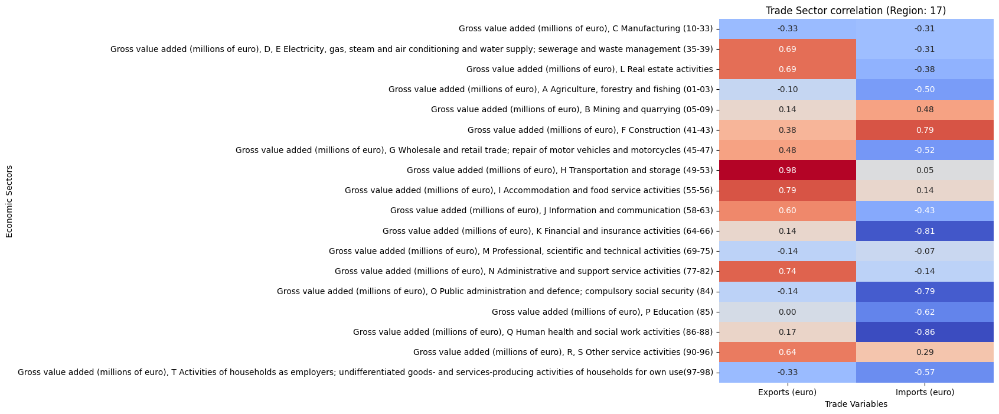


Region: 18
                                                    Exports (euro)  \
Gross value added (millions of euro), C Manufac...           0.643   
Gross value added (millions of euro), D, E Elec...           0.524   
Gross value added (millions of euro), L Real es...          -0.524   
Gross value added (millions of euro), A Agricul...          -0.357   
Gross value added (millions of euro), B Mining ...           0.333   
Gross value added (millions of euro), F Constru...          -0.262   
Gross value added (millions of euro), G Wholesa...           0.071   
Gross value added (millions of euro), H Transpo...          -0.262   
Gross value added (millions of euro), I Accommo...           0.667   
Gross value added (millions of euro), J Informa...           0.643   
Gross value added (millions of euro), K Financi...           0.619   
Gross value added (millions of euro), M Profess...          -0.690   
Gross value added (millions of euro), N Adminis...          -0.333   
Gross va

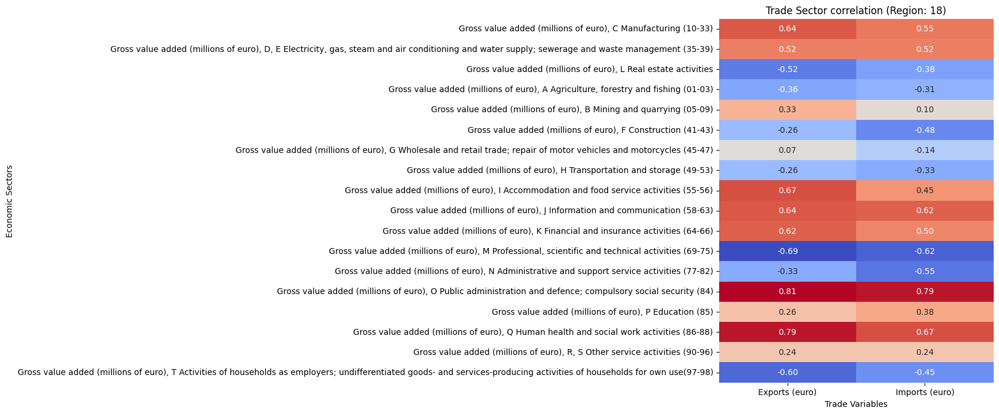


Region: 19
                                                    Exports (euro)  \
Gross value added (millions of euro), C Manufac...           0.881   
Gross value added (millions of euro), D, E Elec...           0.548   
Gross value added (millions of euro), L Real es...           0.571   
Gross value added (millions of euro), A Agricul...           0.119   
Gross value added (millions of euro), B Mining ...           0.238   
Gross value added (millions of euro), F Constru...           0.262   
Gross value added (millions of euro), G Wholesa...           0.905   
Gross value added (millions of euro), H Transpo...           0.643   
Gross value added (millions of euro), I Accommo...           0.214   
Gross value added (millions of euro), J Informa...          -0.238   
Gross value added (millions of euro), K Financi...           0.643   
Gross value added (millions of euro), M Profess...           0.524   
Gross value added (millions of euro), N Adminis...           0.310   
Gross va

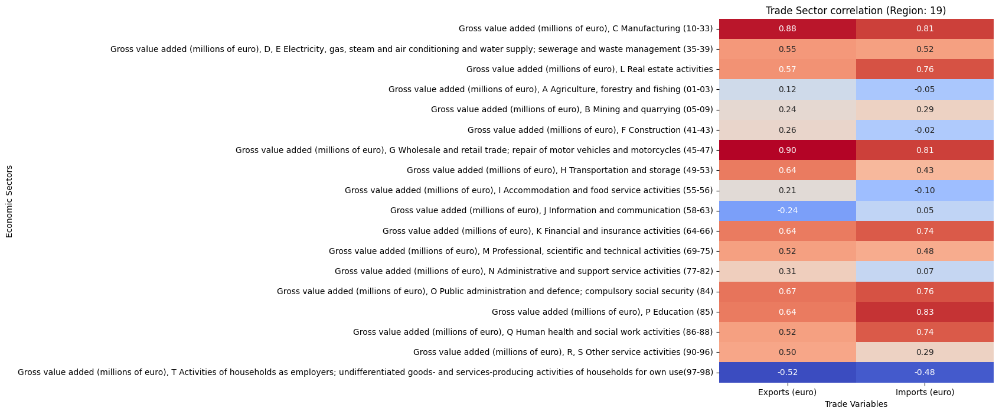


Region: 21
                                                    Exports (euro)  \
Gross value added (millions of euro), C Manufac...           0.429   
Gross value added (millions of euro), D, E Elec...           0.690   
Gross value added (millions of euro), L Real es...           0.429   
Gross value added (millions of euro), A Agricul...          -0.452   
Gross value added (millions of euro), B Mining ...          -0.238   
Gross value added (millions of euro), F Constru...          -0.476   
Gross value added (millions of euro), G Wholesa...           0.738   
Gross value added (millions of euro), H Transpo...           0.643   
Gross value added (millions of euro), I Accommo...           0.595   
Gross value added (millions of euro), J Informa...          -0.333   
Gross value added (millions of euro), K Financi...           0.476   
Gross value added (millions of euro), M Profess...          -0.548   
Gross value added (millions of euro), N Adminis...           0.476   
Gross va

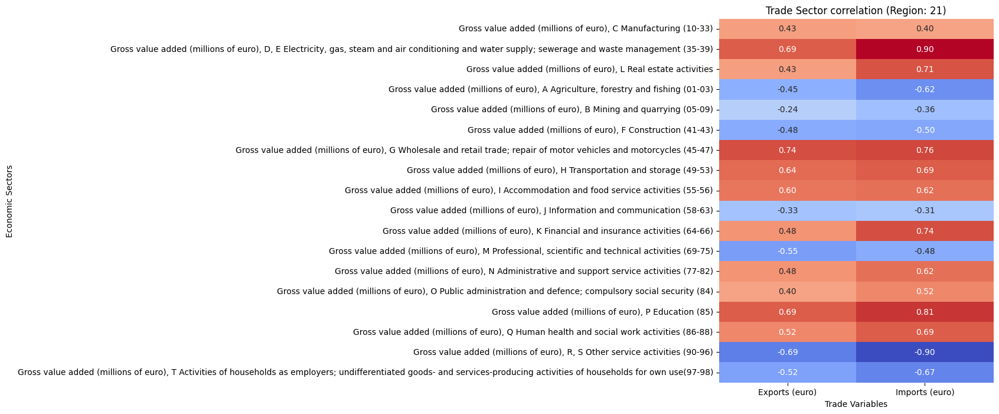

In [7]:
#trade sector correlations
print("\nTrade Sector correlations per region\n")

df_impexp = df_total[(df_total["Year"] >= 2015) & (df_total["Year"] <= 2022)]
region_corrs = {}

for region in regions:
    df_region = df_impexp[df_impexp["Region"] == region]
    df_region = df_region[["Year"] + trade_cols + sector_cols].dropna()

    #skip if too few observations
    if len(df_region) < 4:
        continue

    df_region_detrended = detrend_dataframe(df_region)
    corr = df_region_detrended[trade_cols + sector_cols].corr(method='spearman')
    trade_corr = corr.loc[sector_cols, trade_cols]

    trade_corr = trade_corr.reindex(index=sector_cols, columns=trade_cols)
    region_corrs[region] = trade_corr.values.flatten()

    print(f"\nRegion: {region}")
    print(trade_corr.round(3))

    plt.figure(figsize=(6, 8))
    sns.heatmap(trade_corr, annot=True, fmt=".2f", cmap="coolwarm", cbar=False)
    plt.title(f"Trade Sector correlation (Region: {region})")
    plt.xlabel("Trade Variables")
    plt.ylabel("Economic Sectors")
    plt.tight_layout()
    plt.show()

### Sector to Sector correlations per region (2000–2022)


Sector to Sector correlations per region (2000–2022)



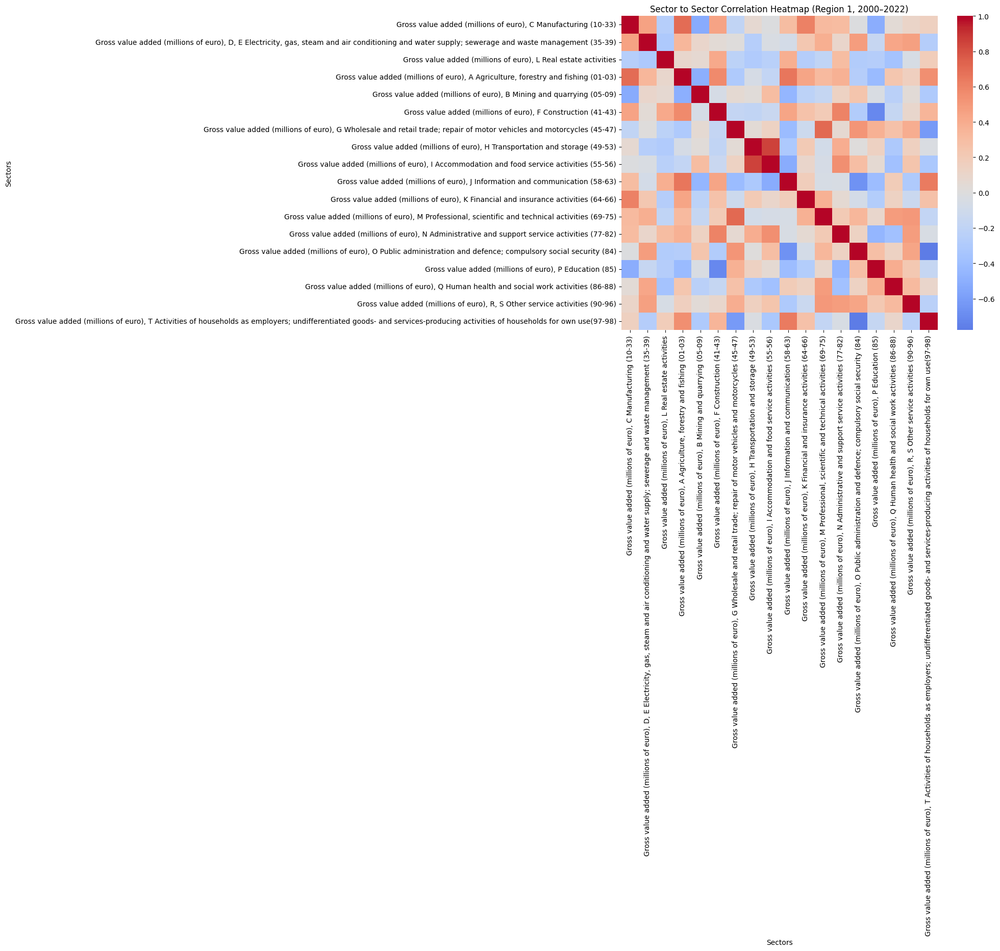

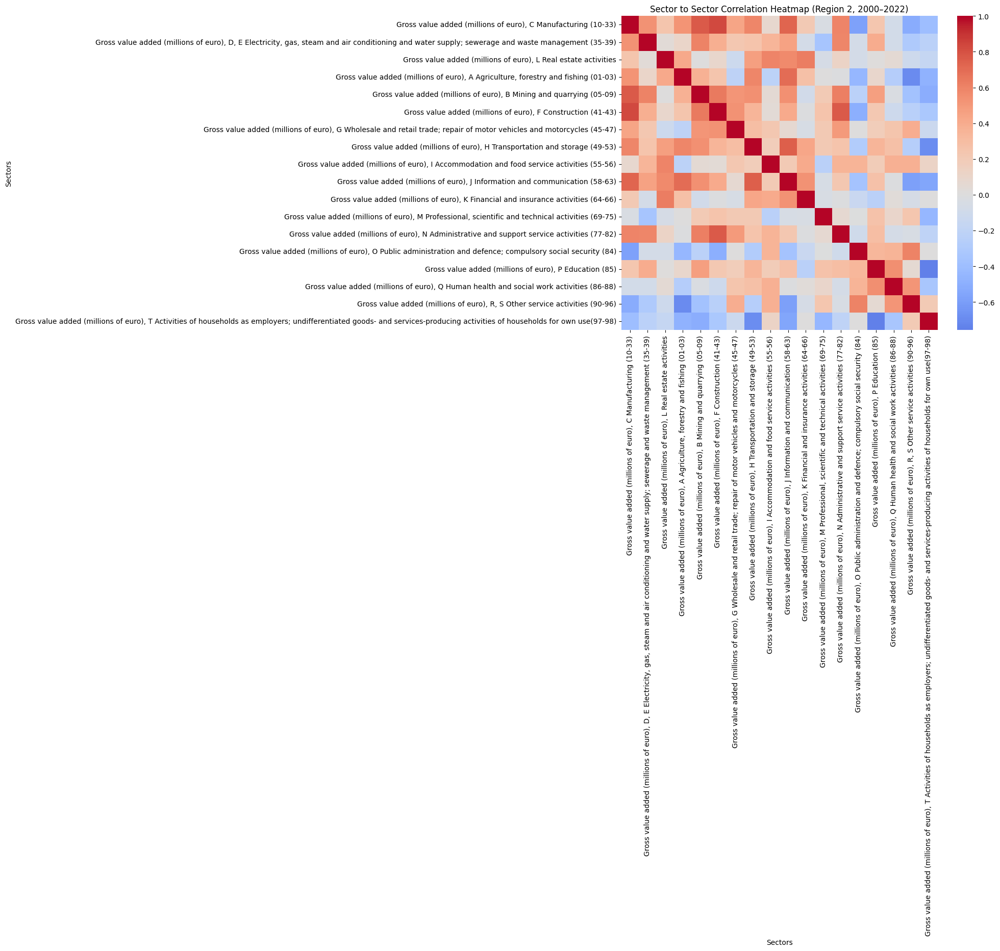

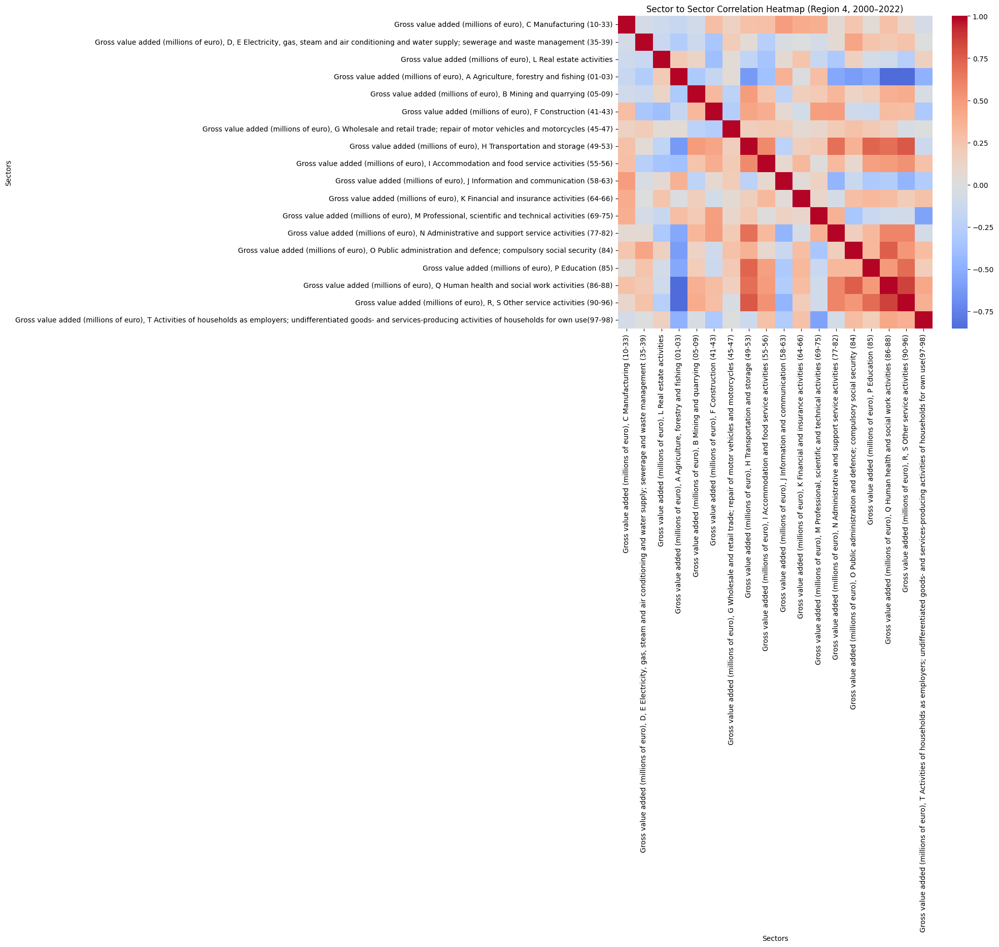

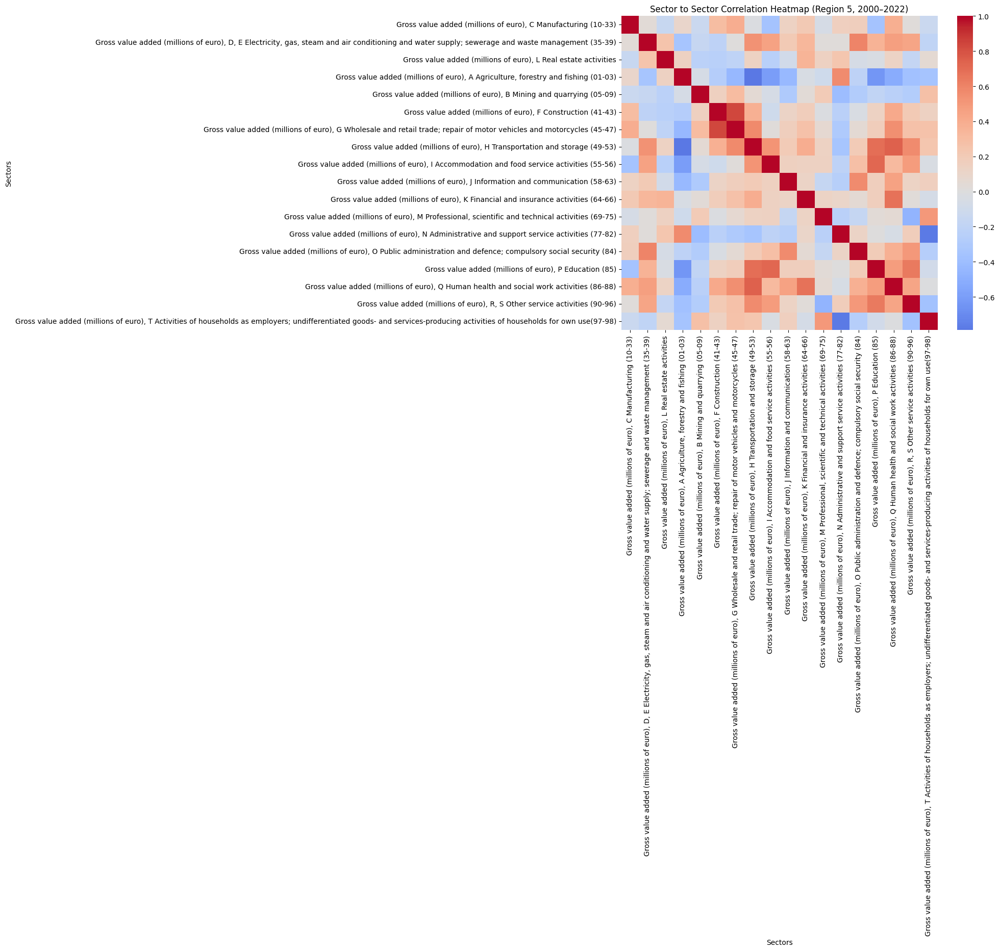

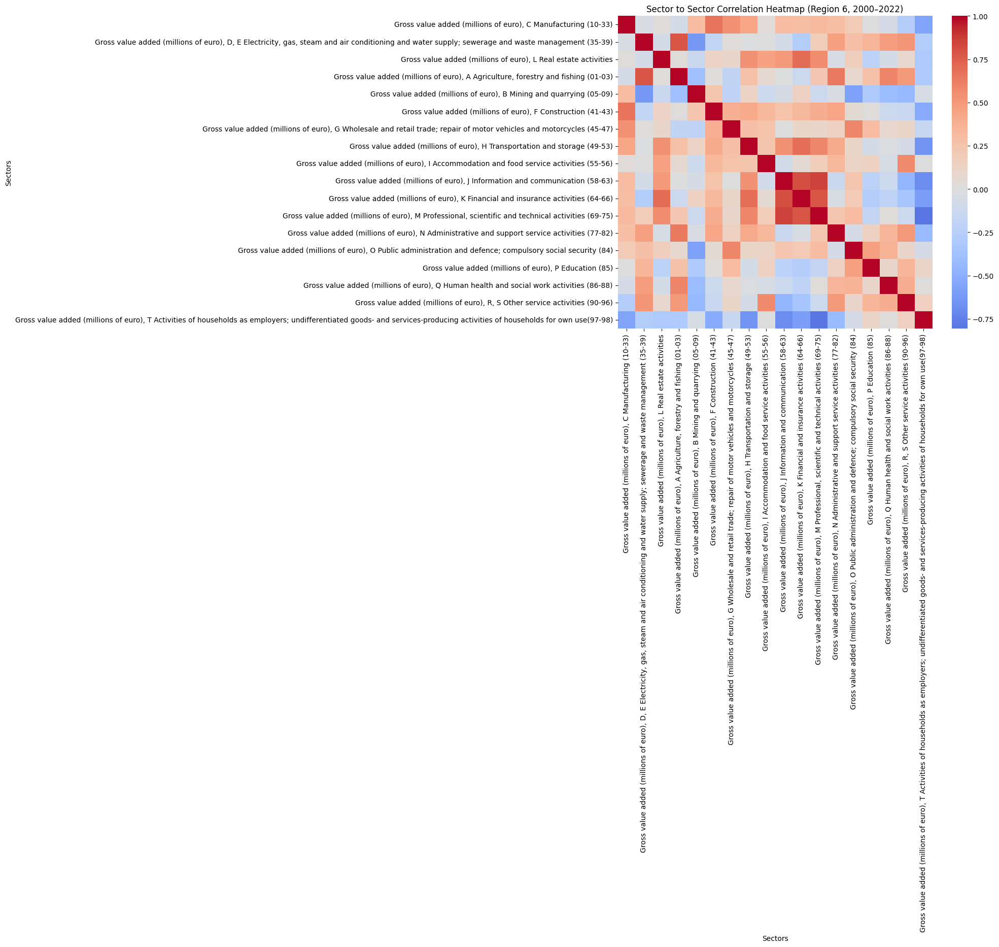

...

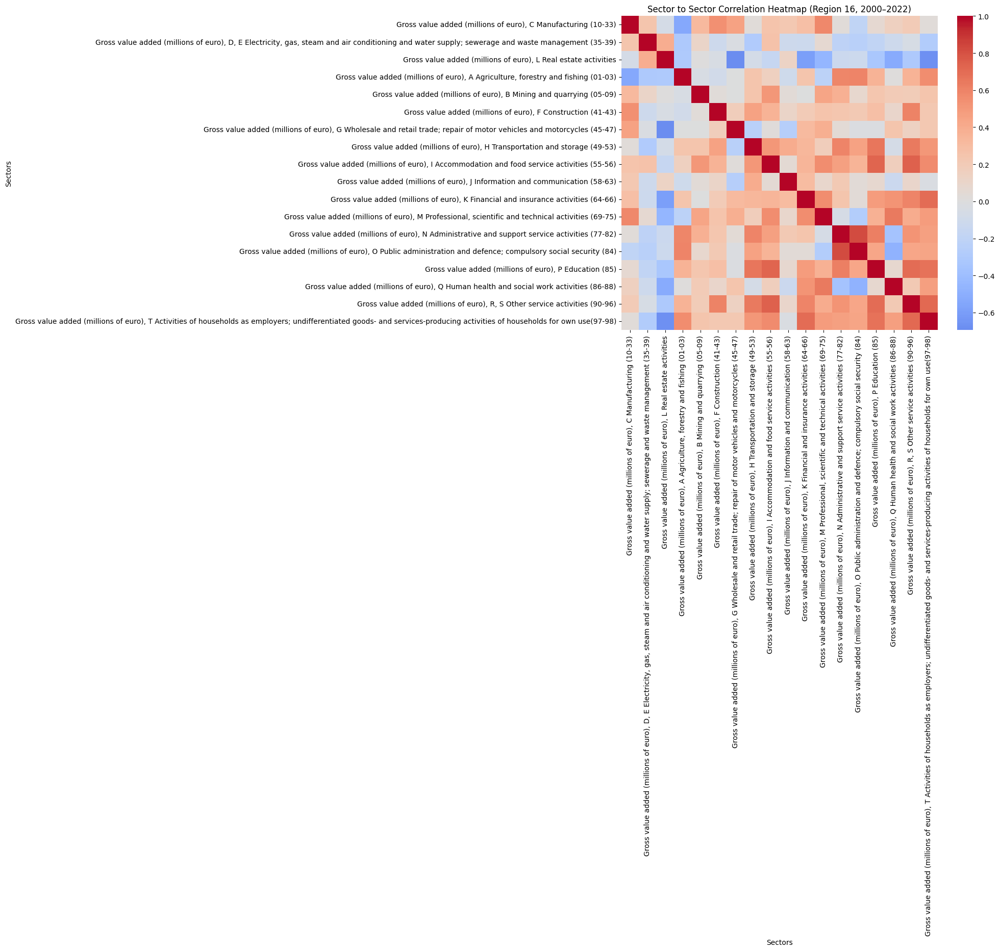

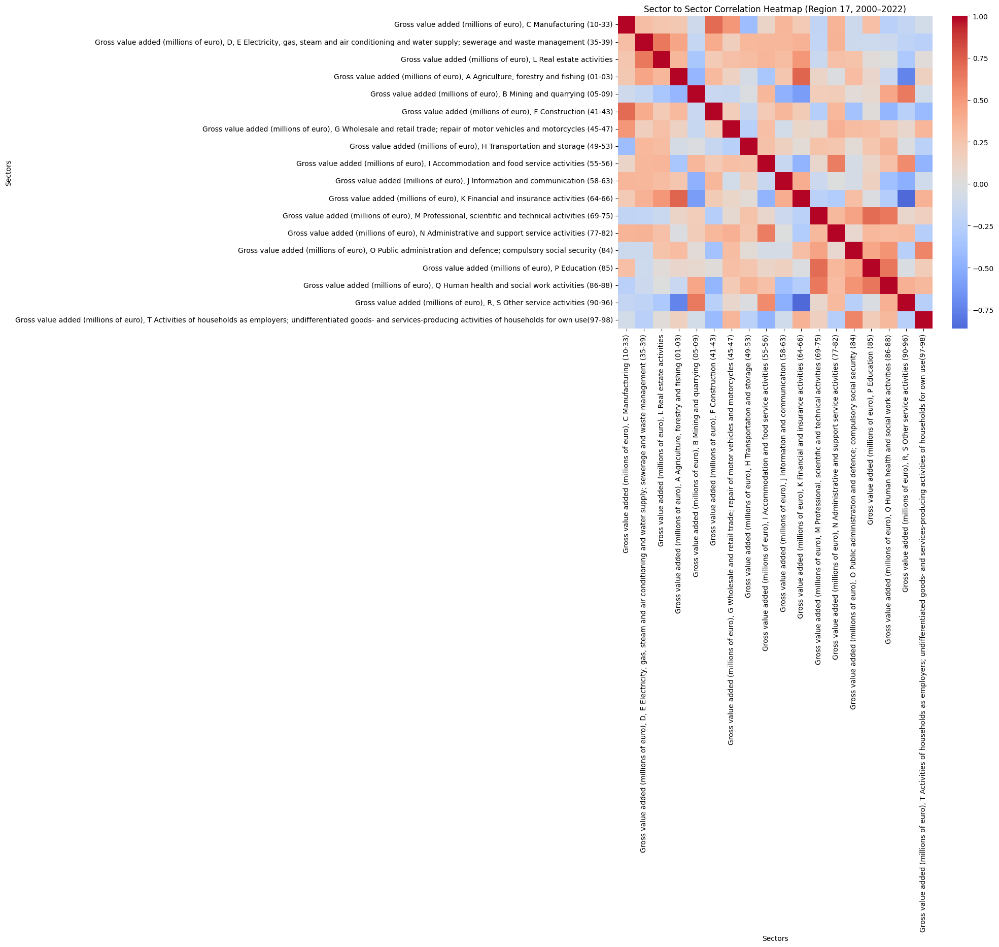

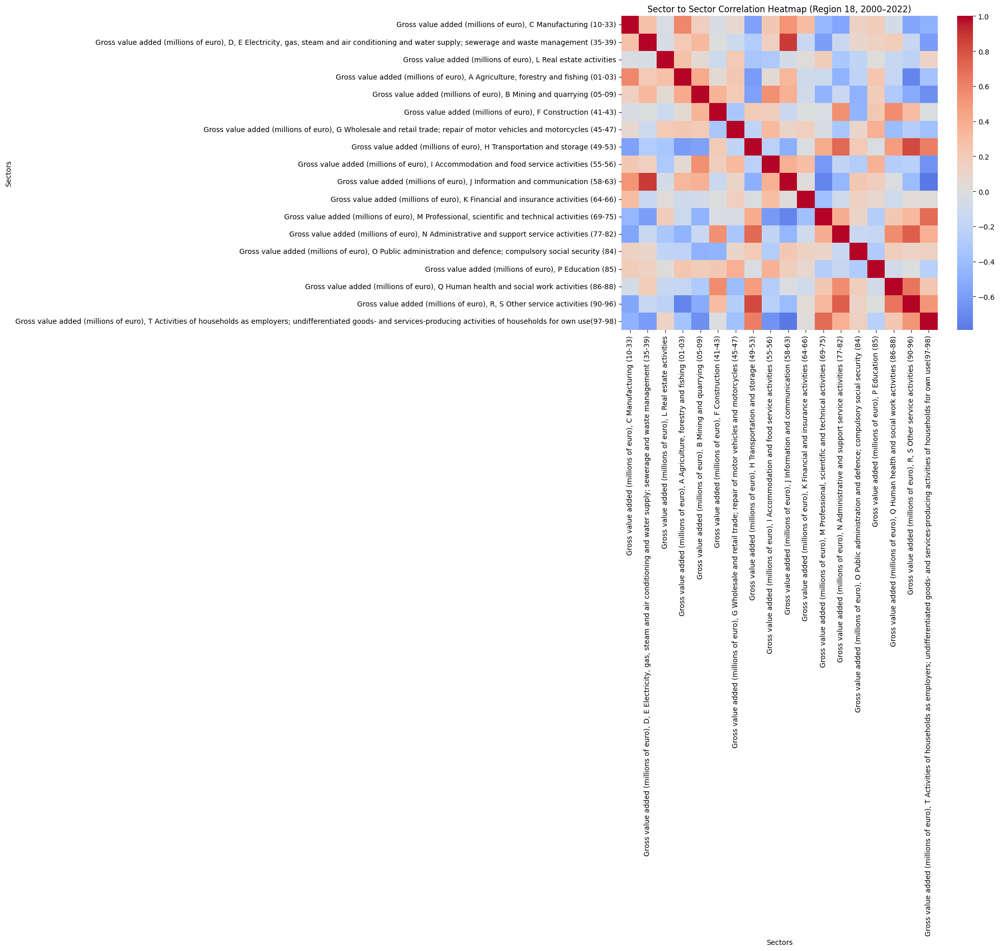

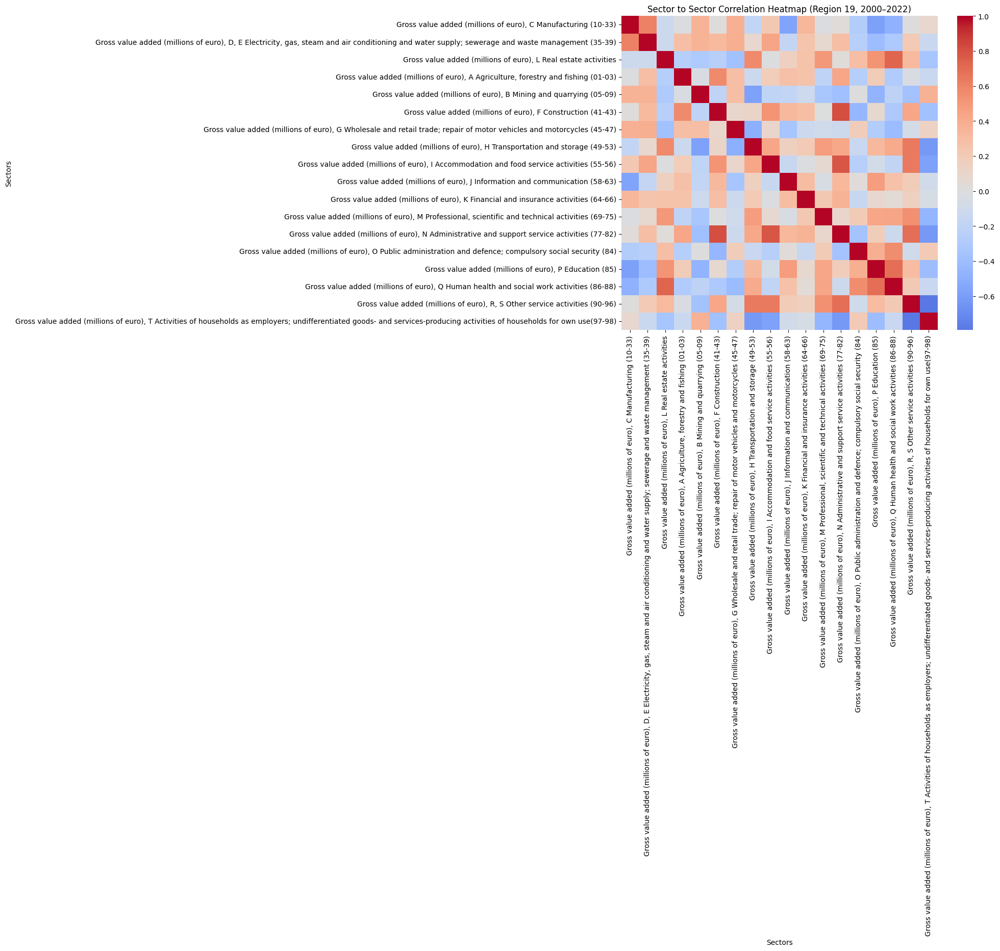

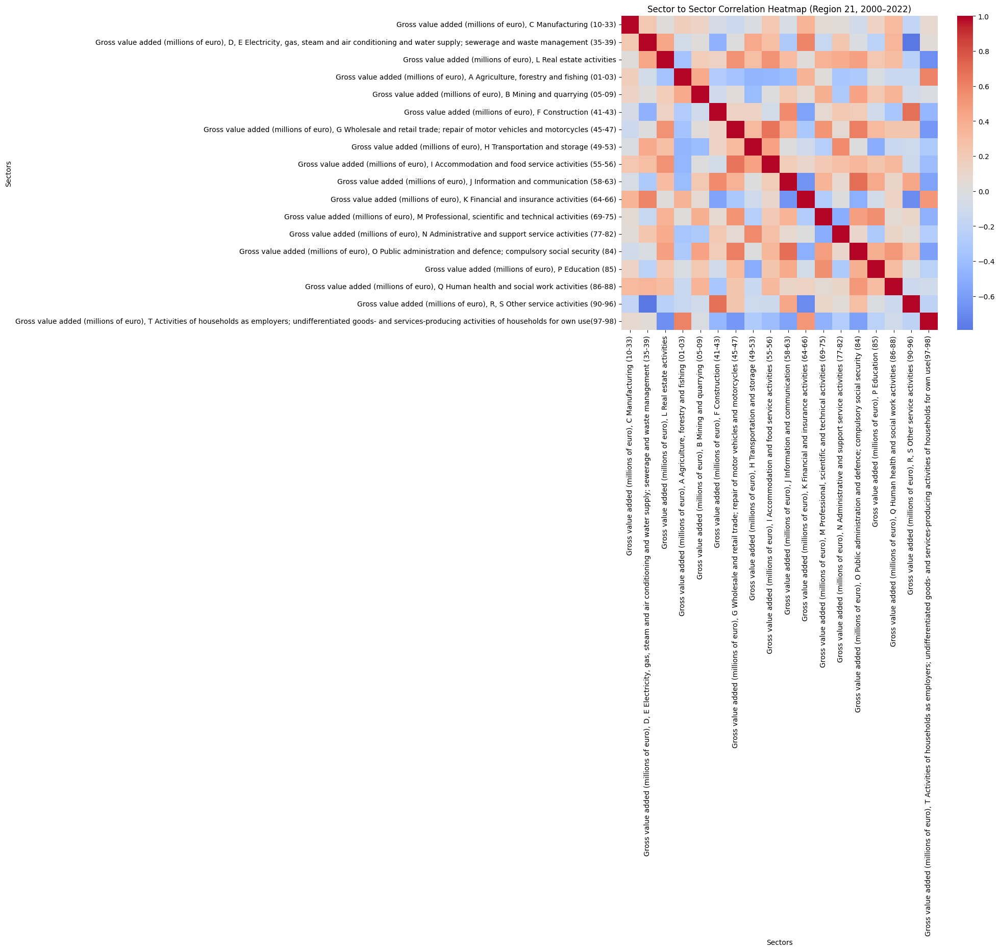

In [8]:
print("\nSector to Sector correlations per region (2000–2022)\n")

for region in regions:
    df_region = df_sector[df_sector["Region"] == region]
    df_region = df_region[["Year"] + sector_cols].dropna()

    #skip if too few observations
    if len(df_region) < 4:
        continue

    df_region_detrended = detrend_dataframe(df_region)
    corr_matrix = df_region_detrended.corr()

    #print(f"\nRegion: {region}")
    #print(corr_matrix.round(2))
    corr_matrix.to_csv(f"../data/correlation/sector_correlation_region_{region}.csv")
    # Plot heatmap
    plt.figure(figsize=(10, 8))
    sns.heatmap(corr_matrix, annot=False, cmap="coolwarm", center=0)
    plt.title(f"Sector to Sector Correlation Heatmap (Region {region}, 2000–2022)")
    plt.xlabel("Sectors")
    plt.ylabel("Sectors")
    plt.tight_layout()
    plt.show()


### Similarity Matrices to compare regions


Similarity of 'Exports (euro)' correlation patterns between regions:

       1      2      4      5      6      7      8      9      10     11  \
1   1.000  0.206  0.548  0.526  0.361  0.173  0.486  0.430  0.371  0.501   
2   0.206  1.000  0.353  0.704  0.235  0.353  0.127  0.165  0.210  0.335   
4   0.548  0.353  1.000  0.563  0.527  0.510  0.233  0.437  0.271  0.520   
5   0.526  0.704  0.563  1.000  0.500  0.370  0.129  0.374  0.413  0.352   
6   0.361  0.235  0.527  0.500  1.000  0.587  0.069  0.265  0.283  0.476   
7   0.173  0.353  0.510  0.370  0.587  1.000  0.160  0.464 -0.017  0.506   
8   0.486  0.127  0.233  0.129  0.069  0.160  1.000  0.238  0.258  0.482   
9   0.430  0.165  0.437  0.374  0.265  0.464  0.238  1.000  0.403  0.654   
10  0.371  0.210  0.271  0.413  0.283 -0.017  0.258  0.403  1.000  0.504   
11  0.501  0.335  0.520  0.352  0.476  0.506  0.482  0.654  0.504  1.000   
12  0.161  0.226  0.244  0.048  0.330  0.473  0.502  0.265  0.276  0.405   
13  0.512  0.336 

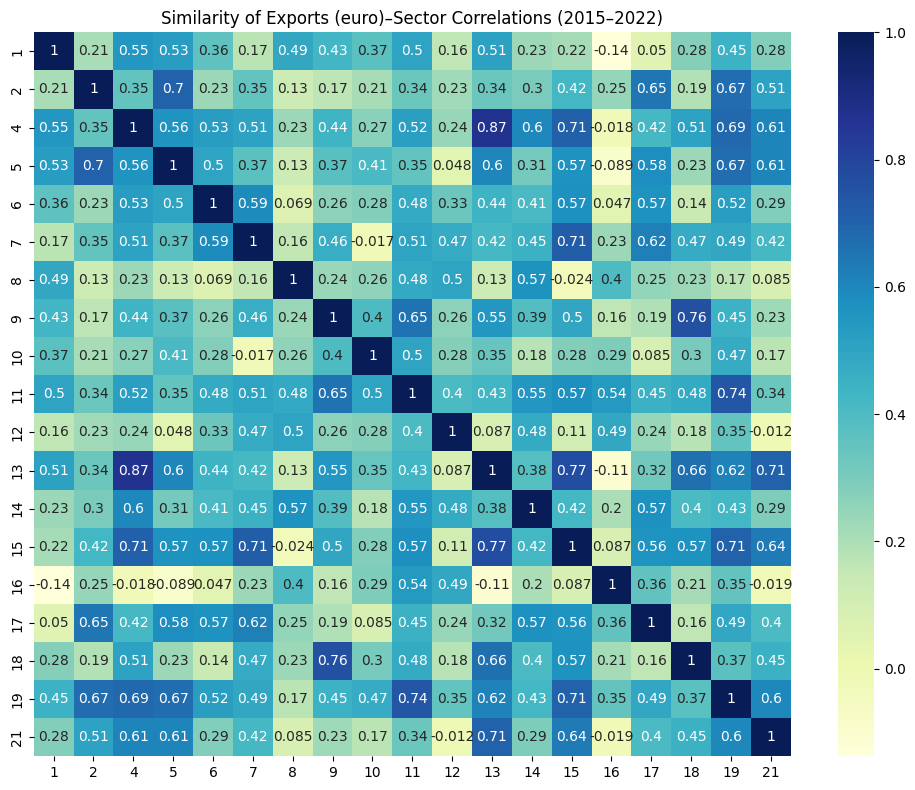


Similarity of 'Imports (euro)' correlation patterns between regions:

       1      2      4      5      6      7      8      9      10     11  \
1   1.000 -0.046 -0.172  0.384  0.331 -0.072  0.412  0.324  0.131  0.272   
2  -0.046  1.000  0.393  0.108  0.112  0.614  0.339  0.551  0.188 -0.528   
4  -0.172  0.393  1.000  0.139 -0.009  0.015  0.122 -0.021  0.267 -0.276   
5   0.384  0.108  0.139  1.000  0.507 -0.077  0.466  0.040  0.725 -0.098   
6   0.331  0.112 -0.009  0.507  1.000  0.079  0.419  0.101  0.172 -0.034   
7  -0.072  0.614  0.015 -0.077  0.079  1.000  0.149  0.518  0.053 -0.117   
8   0.412  0.339  0.122  0.466  0.419  0.149  1.000  0.403  0.329  0.019   
9   0.324  0.551 -0.021  0.040  0.101  0.518  0.403  1.000  0.070 -0.058   
10  0.131  0.188  0.267  0.725  0.172  0.053  0.329  0.070  1.000 -0.110   
11  0.272 -0.528 -0.276 -0.098 -0.034 -0.117  0.019 -0.058 -0.110  1.000   
12  0.526 -0.222 -0.153  0.232  0.024 -0.444  0.016 -0.179  0.083  0.305   
13  0.427 -0.181 

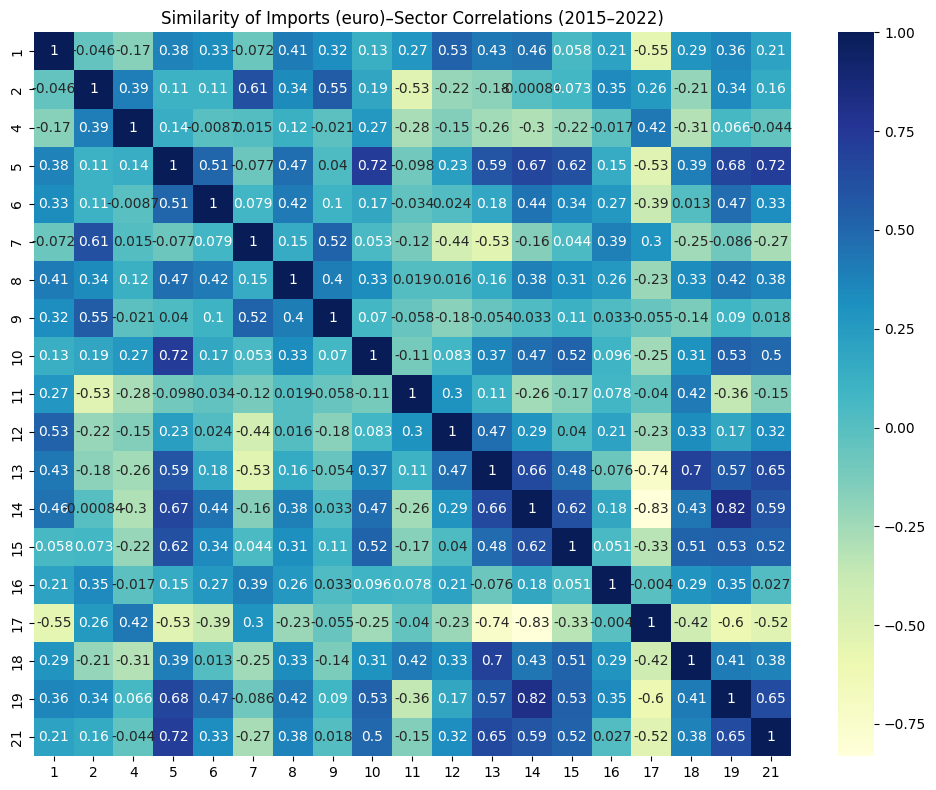

In [9]:
#store correlations per trade variable
trade_similarity = {}

for trade_var in trade_cols:
    trade_vectors = {}

    for region in regions:
        df_region = df_impexp[df_impexp["Region"] == region]
        df_region = df_region[["Year"] + trade_cols + sector_cols].dropna()
        if len(df_region) < 4:
            continue

        df_region_detrended = detrend_dataframe(df_region)
        corr = df_region_detrended[trade_cols + sector_cols].corr(method='spearman')
        #extract correlations between sectors and chosen trade variable
        trade_vector = corr.loc[sector_cols, trade_var]
        trade_vectors[region] = trade_vector.values

    #convert to DataFrame (rows = regions, columns = sectors)
    trade_df = pd.DataFrame(trade_vectors).T

    #compute pairwise cosine similarity between regions
    sim_matrix = cosine_similarity(trade_df)
    sim_df = pd.DataFrame(sim_matrix, index=trade_df.index, columns=trade_df.index)

    print(f"\nSimilarity of '{trade_var}' correlation patterns between regions:\n")
    print(sim_df.round(3))
    
    plt.figure(figsize=(10, 8))
    sns.heatmap(sim_df, annot=True, cmap="YlGnBu")
    plt.title(f"Similarity of {trade_var}–Sector Correlations (2015–2022)")
    plt.tight_layout()
    plt.show()
